In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from sklearn.metrics import accuracy_score  
from sklearn.metrics import precision_score                         
from sklearn.metrics import recall_score

# another libraries
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold 
from sklearn.metrics import roc_auc_score, roc_curve, auc
from lightgbm import LGBMClassifier, early_stopping, log_evaluation
import warnings, gc
warnings.filterwarnings("ignore")
init_notebook_mode(connected=True)

temp=dict(layout=go.Layout(font=dict(family="Franklin Gothic", size=12), 
                           height=500, width=1000))

In [3]:
import pandas as pd
train_data = pd.read_parquet('train_data.parquet')

In [4]:
df = train_data.groupby('customer_ID').tail(1).set_index('customer_ID')

In [5]:
df = df.drop(columns=['S_2'],axis=1)

In [6]:
df.head()

,P_2,D_39,B_1,B_2,R_1,S_3,D_41,B_3,D_42,D_43,...,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145,target
customer_ID,,,,,,,,,,,,,,,,,,,,,
0000099d6bd597052cdcda90ffabf56573fe9d7c79be5fbac11a8ed792feb62a,0.934745,0.009119,0.009382,1.007647,0.006104,0.135021,0.001604,0.007174,NaN,NaN,...,NaN,NaN,0.007186,0.004234,0.005086,NaN,0.005810,0.002970,0.008533,0
00000fd6641609c6ece5454664794f0340ad84dddce9a267a310b5ae68e9d8e5,0.880519,0.178126,0.034684,1.004028,0.006911,0.165509,0.005552,0.005068,NaN,0.060646,...,NaN,NaN,0.002980,0.007479,0.007870,NaN,0.003284,0.003169,0.008514,0
00001b22f846c82c51f6e3958ccd81970162bae8b007e80662ef27519fcc18c1,0.880875,0.009704,0.004284,0.812649,0.006450,NaN,0.003796,0.007196,NaN,NaN,...,NaN,NaN,0.007383,0.006623,0.000964,NaN,0.002202,0.000834,0.003444,0
000041bdba6ecadd89a52d11886e8eaaec9325906c9723355abb5ca523658edc,0.621776,0.001083,0.012564,1.006183,0.007829,0.287766,0.004532,0.009937,NaN,0.046104,...,NaN,NaN,0.002704,0.006184,0.001899,NaN,0.008183,0.005560,0.002983,0
00007889e4fcd2614b6cbe7f8f3d2e5c728eca32d9eb8ad51ca8b8c4a24cefed,0.871900,0.005573,0.007679,0.815746,0.001247,NaN,0.000231,0.005528,NaN,0.044671,...,NaN,NaN,0.002974,0.004162,0.005764,NaN,0.008154,0.006944,0.000905,0


## Rename the columns, initiate Categorical Columns


In [7]:
titles=['Delinquency '+str(i).split('_')[1] if i.startswith('D') else 'Spend '+str(i).split('_')[1] 
        if i.startswith('S') else 'Payment '+str(i).split('_')[1]  if i.startswith('P') 
        else 'Balance '+str(i).split('_')[1] if i.startswith('B') else 
        'Risk '+str(i).split('_')[1] for i in df.columns[:-1]]

In [8]:
# Categorical Columns in the Data
cat_cols=['Balance 30', 'Balance 38', 'Delinquency 63', 'Delinquency 64', 'Delinquency 66', 'Delinquency 68',
          'Delinquency 114', 'Delinquency 116', 'Delinquency 117', 'Delinquency 120', 'Delinquency 126', 'Target']

In [9]:
titles.append('Target')
df.columns=titles

In [10]:
df1 = df.copy() # after rename columns

In [187]:
df = df1.copy()

In [188]:
df.head()

,Payment 2,Delinquency 39,Balance 1,Balance 2,Risk 1,Spend 3,Delinquency 41,Balance 3,Delinquency 42,Delinquency 43,...,Delinquency 137,Delinquency 138,Delinquency 139,Delinquency 140,Delinquency 141,Delinquency 142,Delinquency 143,Delinquency 144,Delinquency 145,Target
customer_ID,,,,,,,,,,,,,,,,,,,,,
0000099d6bd597052cdcda90ffabf56573fe9d7c79be5fbac11a8ed792feb62a,0.934745,0.009119,0.009382,1.007647,0.006104,0.135021,0.001604,0.007174,NaN,NaN,...,NaN,NaN,0.007186,0.004234,0.005086,NaN,0.005810,0.002970,0.008533,0
00000fd6641609c6ece5454664794f0340ad84dddce9a267a310b5ae68e9d8e5,0.880519,0.178126,0.034684,1.004028,0.006911,0.165509,0.005552,0.005068,NaN,0.060646,...,NaN,NaN,0.002980,0.007479,0.007870,NaN,0.003284,0.003169,0.008514,0
00001b22f846c82c51f6e3958ccd81970162bae8b007e80662ef27519fcc18c1,0.880875,0.009704,0.004284,0.812649,0.006450,NaN,0.003796,0.007196,NaN,NaN,...,NaN,NaN,0.007383,0.006623,0.000964,NaN,0.002202,0.000834,0.003444,0
000041bdba6ecadd89a52d11886e8eaaec9325906c9723355abb5ca523658edc,0.621776,0.001083,0.012564,1.006183,0.007829,0.287766,0.004532,0.009937,NaN,0.046104,...,NaN,NaN,0.002704,0.006184,0.001899,NaN,0.008183,0.005560,0.002983,0
00007889e4fcd2614b6cbe7f8f3d2e5c728eca32d9eb8ad51ca8b8c4a24cefed,0.871900,0.005573,0.007679,0.815746,0.001247,NaN,0.000231,0.005528,NaN,0.044671,...,NaN,NaN,0.002974,0.004162,0.005764,NaN,0.008154,0.006944,0.000905,0


In [12]:
temp=dict(layout=go.Layout(font=dict(family="Franklin Gothic", size=12), 
                           height=500, width=1000))
target=df.Target.value_counts(normalize=True)
target.rename(index={1:'Default',0:'Paid'},inplace=True)
pal, color=['#016CC9','#DEB078'], ['#8DBAE2','#EDD3B3']
fig=go.Figure()
fig.add_trace(go.Pie(labels=target.index, values=target*100, hole=.45, 
                     showlegend=True,sort=False, 
                     marker=dict(colors=color,line=dict(color=pal,width=2.5)),
                     hovertemplate = "%{label} Accounts: %{value:.2f}%<extra></extra>"))
fig.update_layout(template=temp, title='Target Distribution', 
                  legend=dict(traceorder='reversed',y=1.05,x=0),
                  uniformtext_minsize=15, uniformtext_mode='hide',width=700)
fig.show()

## Eda of Delquency Variables


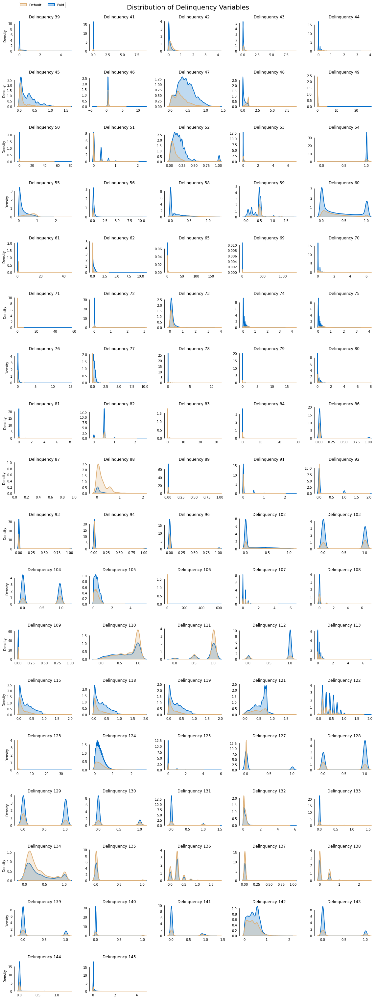

In [13]:
# Draw Histogram of numerical Data
cols=[col for col in df.columns if (col.startswith(('D','T'))) & (col not in cat_cols[:-1])]
plot_df=df[cols]
fig, ax = plt.subplots(18,5, figsize=(16,54))
fig.suptitle('Distribution of Delinquency Variables',fontsize=20)
row=0
col=[0,1,2,3,4]*18
for i, column in enumerate(plot_df.columns[:-1]):
    if (i!=0)&(i%5==0):
        row+=1
    sns.kdeplot(x=column, hue='Target', palette=pal[::-1], hue_order=[1,0], #Kdeplot==Histogram
                label=['Default','Paid'], data=plot_df, 
                fill=True, linewidth=2, legend=False, ax=ax[row,col[i]])
    ax[row,col[i]].tick_params(left=False,bottom=False)
    ax[row,col[i]].set(title='\n\n{}'.format(column), xlabel='', ylabel=('Density' if i%5==0 else ''))
for i in range(2,5):
    ax[17,i].set_visible(False)
handles, _ = ax[0,0].get_legend_handles_labels() 
fig.legend(labels=['Default','Paid'], handles=reversed(handles), ncol=2, bbox_to_anchor=(0.18, 0.983))
sns.despine(bottom=True, trim=True)
plt.tight_layout(rect=[0, 0.2, 1, 0.99])

In [18]:
#df.groupby('Target')['Delinquency 47'].describe()

In [19]:
#df.groupby('Target')['Delinquency 46'].describe()

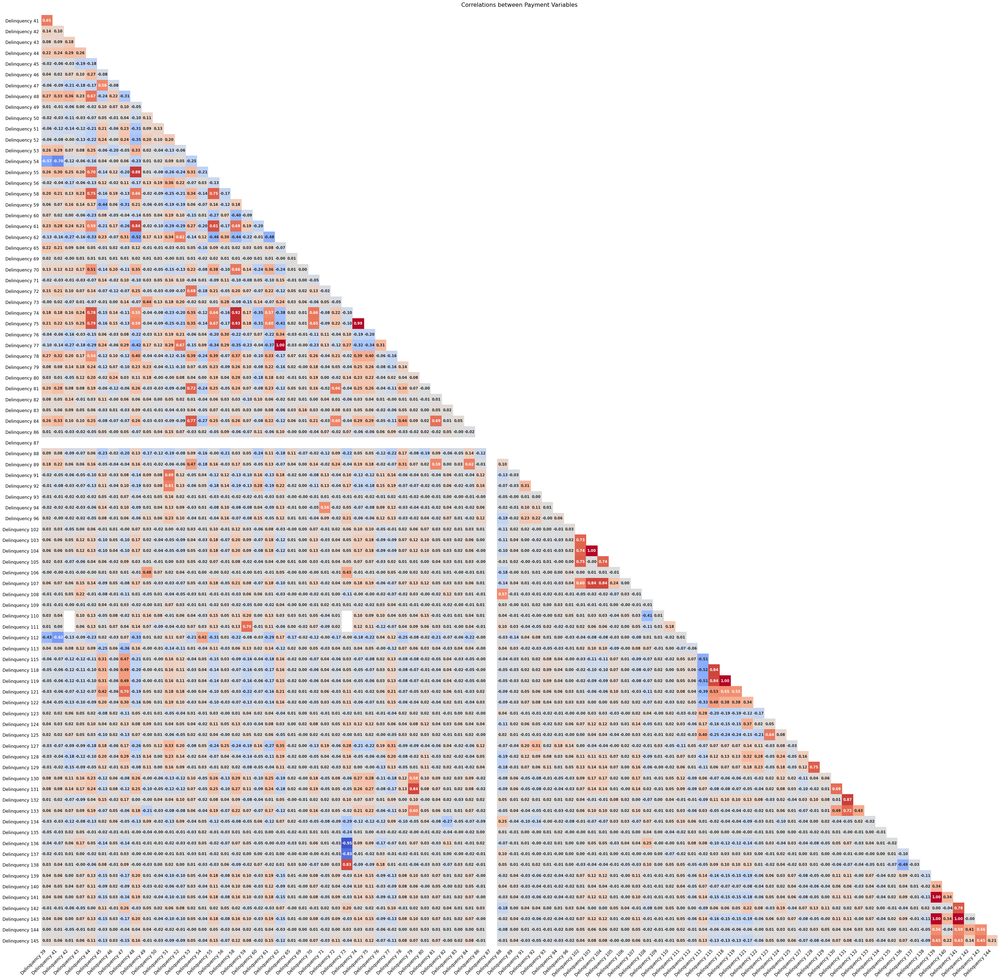

In [16]:
corr=plot_df.iloc[:,:-1].corr()
mask=np.triu(np.ones_like(corr, dtype=bool))[1:,:-1]
corr=corr.iloc[1:,:-1].copy()
fig, ax = plt.subplots(figsize=(48,48))   
sns.heatmap(corr, mask=mask, vmin=-1, vmax=1, center=0, annot=True, fmt='.2f', 
            cmap='coolwarm', annot_kws={'fontsize':10,'fontweight':'bold'}, cbar=False)
ax.tick_params(left=False,bottom=False)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right',fontsize=12)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)
plt.title('Correlations between Payment Variables\n', fontsize=16)
fig.show() # once Color get darker .. relationship become stronger

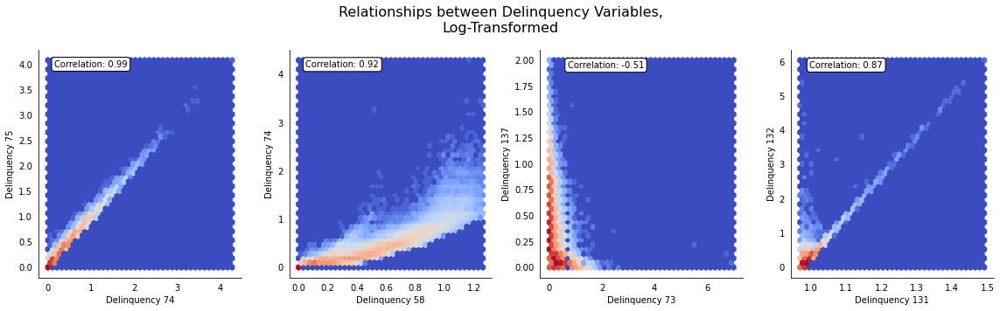

In [17]:
fig, ax = plt.subplots(1,4, figsize=(16,5))
fig.suptitle('Relationships between Delinquency Variables,\nLog-Transformed',fontsize=16)
ax[0].hexbin(x='Delinquency 74', y='Delinquency 75', data=plot_df, bins='log', gridsize=40, cmap='coolwarm')
ax[0].set(xlabel='Delinquency 74',ylabel='Delinquency 75')
ax[0].text(1, 4, 'Correlation: {:.2f}'.format(plot_df[['Delinquency 74','Delinquency 75']].corr().iloc[1,0]), 
           ha="center", va="center",bbox=dict(boxstyle="round,pad=0.3",fc="white"))
ax[1].hexbin(x='Delinquency 58', y='Delinquency 74', data=plot_df, bins='log', gridsize=40, cmap='coolwarm')
ax[1].set(xlabel='Delinquency 58',ylabel='Delinquency 74')
ax[1].text(0.3, 4.2, 'Correlation: {:.2f}'.format(plot_df[['Delinquency 58','Delinquency 74']].corr().iloc[1,0]),
           ha="center", va="center",bbox=dict(boxstyle="round,pad=0.3",fc="white"))
ax[2].hexbin(x='Delinquency 113', y='Delinquency 115', data=plot_df, bins='log', gridsize=40, cmap='coolwarm')
ax[2].set(xlabel='Delinquency 73',ylabel='Delinquency 137')
ax[2].text(2.15, 1.95, 'Correlation: {:.2f}'.format(plot_df[['Delinquency 113','Delinquency 115']].corr().iloc[1,0]), 
           ha="center", va="center",bbox=dict(boxstyle="round,pad=0.3",fc="white"))
ax[3].hexbin(x='Delinquency 131', y='Delinquency 132', data=plot_df, bins='log', gridsize=40, cmap='coolwarm')
ax[3].set(xlabel='Delinquency 131',ylabel='Delinquency 132')
ax[3].text(1.1, 5.9, 'Correlation: {:.2f}'.format(plot_df[['Delinquency 131','Delinquency 132']].corr().iloc[1,0]), 
           ha="center", va="center",bbox=dict(boxstyle="round,pad=0.3",fc="white"))

for i in range(4):
    ax[i].tick_params(left=False,bottom=False)
sns.despine()
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.show()

## Eda of Spend Variables

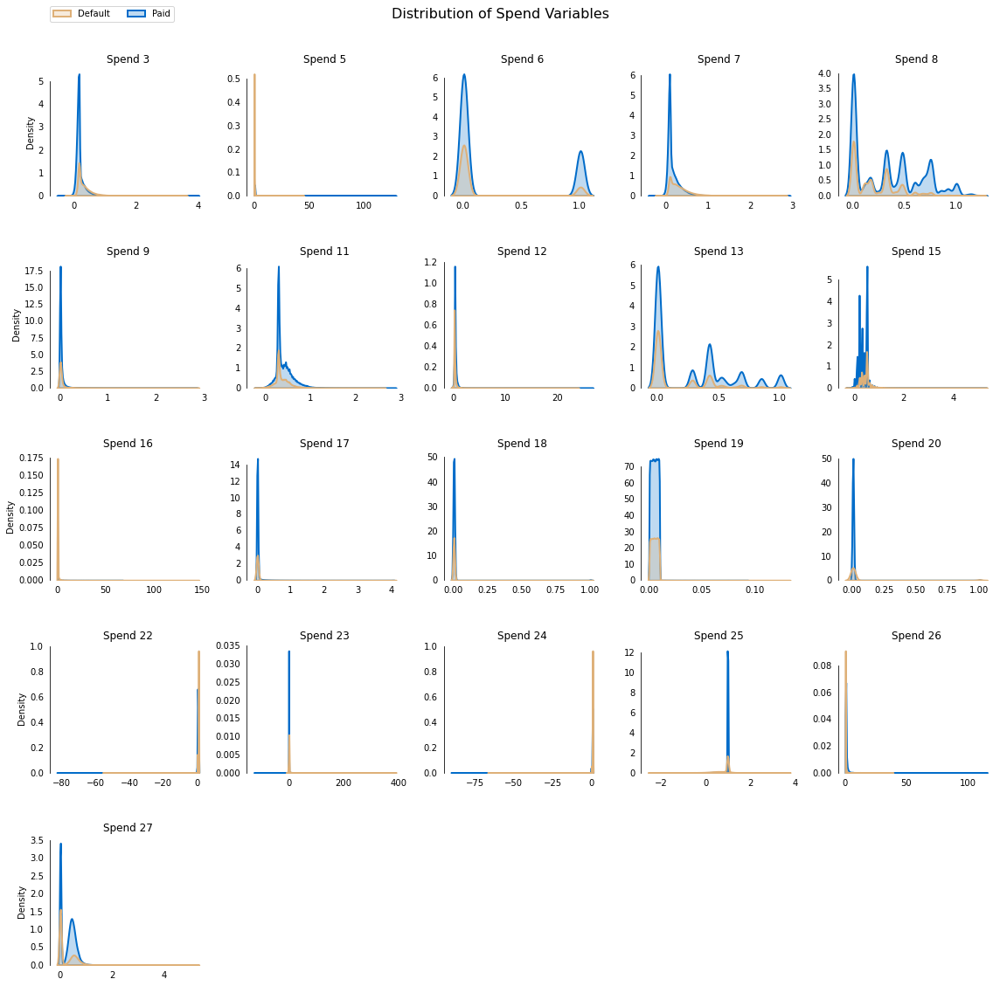

In [18]:

cols=[col for col in df.columns if (col.startswith(('S','T'))) & (col not in cat_cols[:-1])]
plot_df=df[cols]
fig, ax = plt.subplots(5,5, figsize=(16,20))
fig.suptitle('Distribution of Spend Variables',fontsize=16)
row=0
col=[0,1,2,3,4]*5
for i, column in enumerate(plot_df.columns[:-1]):
    if (i!=0)&(i%5==0):
        row+=1
    sns.kdeplot(x=column, hue='Target', palette=pal[::-1], hue_order=[1,0], 
                label=['Default','Paid'], data=plot_df, 
                fill=True, linewidth=2, legend=False, ax=ax[row,col[i]])
    ax[row,col[i]].tick_params(left=False,bottom=False)
    ax[row,col[i]].set(title='\n\n{}'.format(column), xlabel='', ylabel=('Density' if i%5==0 else ''))
for i in range(1,5):
    ax[4,i].set_visible(False)
handles, _ = ax[0,0].get_legend_handles_labels() 
fig.legend(labels=['Default','Paid'], handles=reversed(handles), ncol=2, bbox_to_anchor=(0.18, 0.985))
sns.despine(bottom=True, trim=True)
plt.tight_layout(rect=[0, 0.2, 1, 0.99])


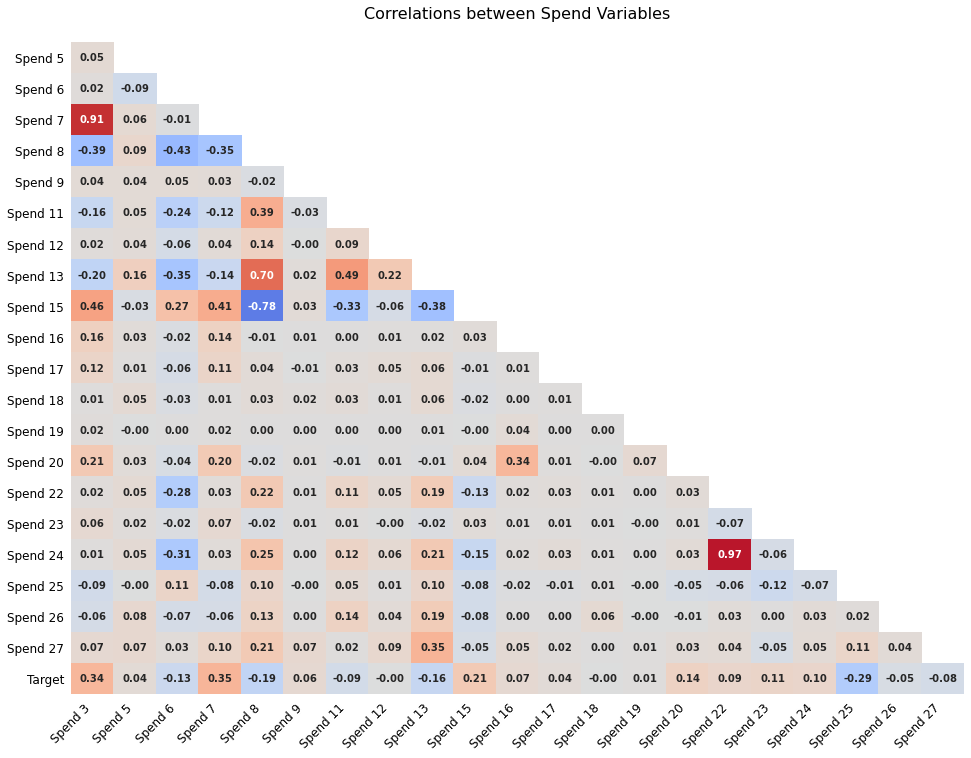

In [19]:
corr=plot_df.corr()
mask=np.triu(np.ones_like(corr, dtype=bool))[1:,:-1]
corr=corr.iloc[1:,:-1].copy()
fig, ax = plt.subplots(figsize=(16,12))   
sns.heatmap(corr, mask=mask, vmin=-1, vmax=1, center=0, annot=True, fmt='.2f', 
            cmap='coolwarm', annot_kws={'fontsize':10,'fontweight':'bold'}, cbar=False)
ax.tick_params(left=False,bottom=False)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right',fontsize=12)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)
plt.title('Correlations between Spend Variables\n', fontsize=16)
fig.show()

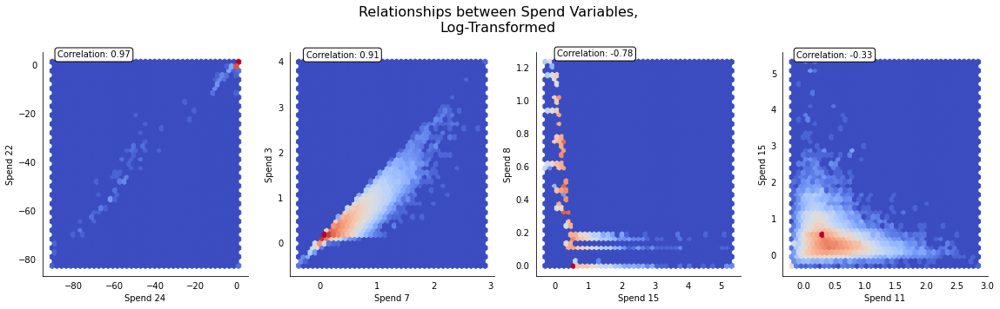

In [20]:
fig, ax = plt.subplots(1,4, figsize=(16,5))
fig.suptitle('Relationships between Spend Variables,\nLog-Transformed',fontsize=16)
ax[0].hexbin(x='Spend 24', y='Spend 22', data=plot_df, bins='log', gridsize=40, cmap='coolwarm')
ax[0].set(xlabel='Spend 24',ylabel='Spend 22')
ax[0].text(-70, 4, 'Correlation: {:.2f}'.format(plot_df[['Spend 24','Spend 22']].corr().iloc[1,0]), 
           ha="center", va="center",bbox=dict(boxstyle="round,pad=0.3",fc="white"))
ax[1].hexbin(x='Spend 7', y='Spend 3', data=plot_df, bins='log', gridsize=40, cmap='coolwarm')
ax[1].set(xlabel='Spend 7',ylabel='Spend 3')
ax[1].text(0.4, 4.15, 'Correlation: {:.2f}'.format(plot_df[['Spend 7','Spend 3']].corr().iloc[1,0]),
           ha="center", va="center",bbox=dict(boxstyle="round,pad=0.3",fc="white"))
ax[2].hexbin(x='Spend 15', y='Spend 8', data=plot_df, bins='log', gridsize=40, cmap='coolwarm')
ax[2].set(xlabel='Spend 15',ylabel='Spend 8')
ax[2].text(1.2, 1.28, 'Correlation: {:.2f}'.format(plot_df[['Spend 15','Spend 8']].corr().iloc[1,0]), 
           ha="center", va="center",bbox=dict(boxstyle="round,pad=0.3",fc="white"))
ax[3].hexbin(x='Spend 11', y='Spend 15', data=plot_df, bins='log', gridsize=40, cmap='coolwarm')
ax[3].set(xlabel='Spend 11',ylabel='Spend 15')
ax[3].text(.5,5.5, 'Correlation: {:.2f}'.format(plot_df[['Spend 11','Spend 15']].corr().iloc[1,0]), 
           ha="center", va="center",bbox=dict(boxstyle="round,pad=0.3",fc="white"))
for i in range(4):
    ax[i].tick_params(left=False,bottom=False)
sns.despine()
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.show()

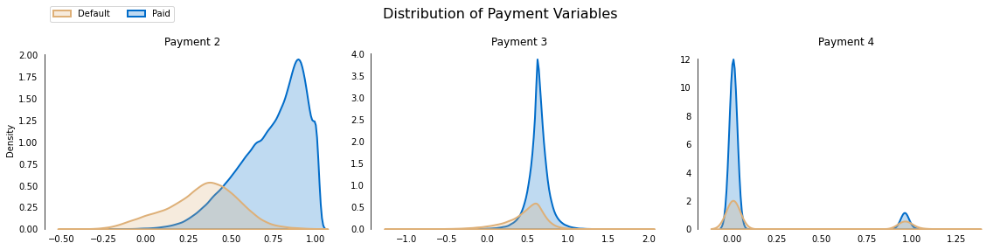

In [21]:
## EDa of payment Variable 
cols=[col for col in df.columns if (col.startswith(('P','T'))) & (col not in cat_cols[:-1])]
plot_df=df[cols]
fig, ax = plt.subplots(1,3, figsize=(16,5))
fig.suptitle('Distribution of Payment Variables',fontsize=16)
for i, col in enumerate(plot_df.columns[:-1]):
    sns.kdeplot(x=col, hue='Target', palette=pal[::-1], hue_order=[1,0], 
                label=['Default','Paid'], data=plot_df, 
                fill=True, linewidth=2, legend=False, ax=ax[i])
    ax[i].tick_params(left=False,bottom=False)
    ax[i].set(title='{}'.format(col), xlabel='', ylabel=('Density' if i==0 else ''))
handles, _ = ax[0].get_legend_handles_labels() 
fig.legend(labels=['Default','Paid'], handles=reversed(handles), ncol=2, bbox_to_anchor=(0.18, 1))
sns.despine(bottom=True, trim=True)
plt.tight_layout(rect=[0, 0.2, 1, 0.99])

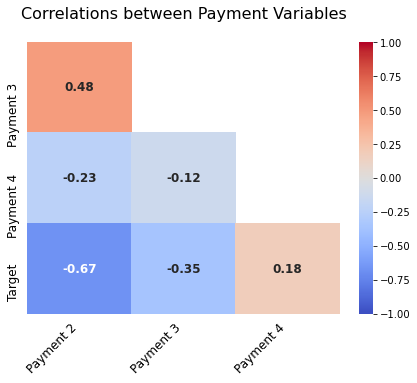

In [22]:
corr=plot_df.corr()
mask=np.triu(np.ones_like(corr, dtype=bool))[1:,:-1]
corr=corr.iloc[1:,:-1].copy()
fig, ax = plt.subplots(figsize=(7,5)) 
sns.heatmap(corr, mask=mask, vmin=-1, vmax=1, center=0, annot=True, fmt='.2f', 
            cmap='coolwarm', annot_kws={'fontsize':12,'fontweight':'bold'})
ax.tick_params(left=False,bottom=False)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right',fontsize=12)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)
plt.title('Correlations between Payment Variables\n', fontsize=16)
fig.show()

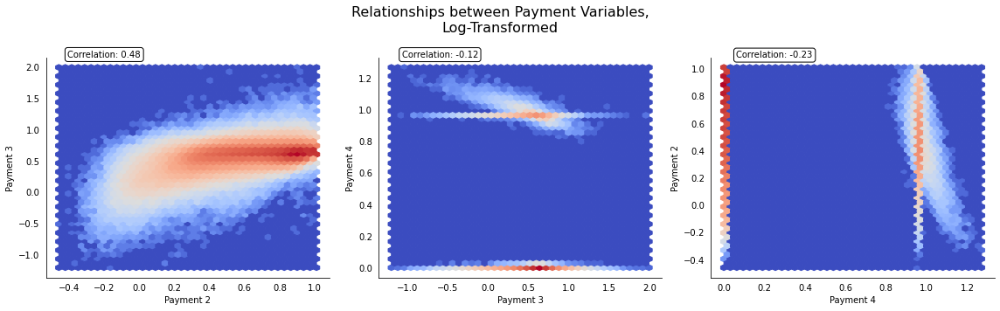

In [23]:
fig, ax = plt.subplots(1,3, figsize=(16,5))
fig.suptitle('Relationships between Payment Variables,\nLog-Transformed',fontsize=16)
ax[0].hexbin(x='Payment 2', y='Payment 3', data=plot_df, bins='log', gridsize=40, cmap='coolwarm')
ax[0].text(-.2,2.2, 'Correlation: {:.2f}'.format(plot_df[['Payment 2','Payment 3']].corr().iloc[1,0]), 
           ha="center", va="center",bbox=dict(boxstyle="round,pad=0.3",fc="white"))
ax[0].set(xlabel='Payment 2',ylabel='Payment 3')
ax[1].hexbin(x='Payment 3', y='Payment 4', data=plot_df, bins='log', gridsize=40, cmap='coolwarm')
ax[1].text(-.6,1.35, 'Correlation: {:.2f}'.format(plot_df[['Payment 3','Payment 4']].corr().iloc[1,0]), 
           ha="center", va="center",bbox=dict(boxstyle="round,pad=0.3",fc="white"))
ax[1].set(xlabel='Payment 3',ylabel='Payment 4')
ax[2].hexbin(x='Payment 4', y='Payment 2', data=plot_df, bins='log', gridsize=40, cmap='coolwarm')
ax[2].text(.25,1.1, 'Correlation: {:.2f}'.format(plot_df[['Payment 4','Payment 2']].corr().iloc[1,0]), 
           ha="center", va="center",bbox=dict(boxstyle="round,pad=0.3",fc="white"))
ax[2].set(xlabel='Payment 4',ylabel='Payment 2')
for i in range(3):
    ax[i].tick_params(left=False,bottom=False)
sns.despine()
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.show()

## EDa of Balance Variables


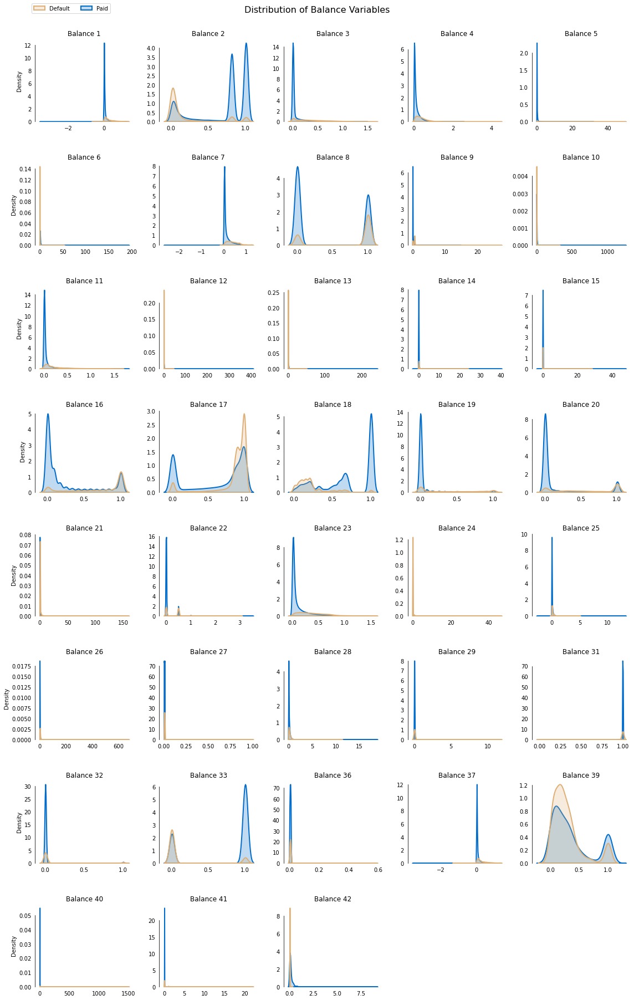

In [24]:
cols=[col for col in df.columns if (col.startswith(('B','T'))) & (col not in cat_cols[:-1])]
plot_df=df[cols]
fig, ax = plt.subplots(8,5, figsize=(16,32))
fig.suptitle('Distribution of Balance Variables',fontsize=16)
row=0
col=[0,1,2,3,4]*8
for i, column in enumerate(plot_df.columns[:-1]):
    if (i!=0)&(i%5==0):
        row+=1
    sns.kdeplot(x=column, hue='Target', palette=pal[::-1], hue_order=[1,0], 
                label=['Default','Paid'], data=plot_df, 
                fill=True, linewidth=2, legend=False, ax=ax[row,col[i]])
    ax[row,col[i]].tick_params(left=False,bottom=False)
    ax[row,col[i]].set(title='\n\n{}'.format(column), xlabel='', ylabel=('Density' if i%5==0 else ''))
for i in range(3,5):
    ax[7,i].set_visible(False)
handles, _ = ax[0,0].get_legend_handles_labels() 
fig.legend(labels=['Default','Paid'], handles=reversed(handles), ncol=2, bbox_to_anchor=(0.18, 0.984))
sns.despine(bottom=True, trim=True)
plt.tight_layout(rect=[0, 0.2, 1, 0.99])

In [30]:
df.groupby('Target')['Balance 39'].describe()

,count,mean,std,min,25%,50%,75%,max
Target,,,,,,,,
0,1928.0,0.360587,0.340059,-0.015051,0.087129,0.243884,0.490619,1.091834
1,2177.0,0.284845,0.263560,-0.043803,0.108628,0.214214,0.350113,1.010391


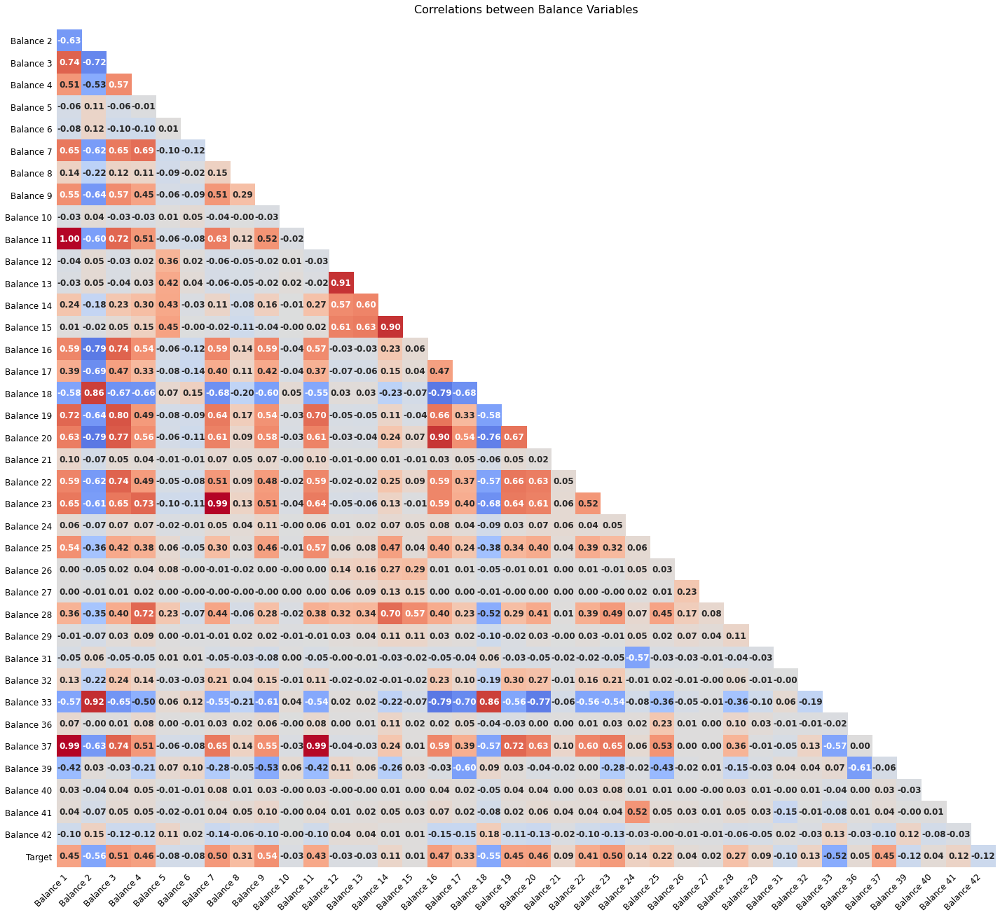

In [25]:
corr=plot_df.corr()
mask=np.triu(np.ones_like(corr, dtype=bool))[1:,:-1]
corr=corr.iloc[1:,:-1].copy()
fig, ax = plt.subplots(figsize=(24,22))   
sns.heatmap(corr, mask=mask, vmin=-1, vmax=1, center=0, annot=True, fmt='.2f', 
            cmap='coolwarm', annot_kws={'fontsize':12,'fontweight':'bold'}, cbar=False)
ax.tick_params(left=False,bottom=False)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right',fontsize=12)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)
plt.title('Correlations between Balance Variables\n', fontsize=16)
fig.show()

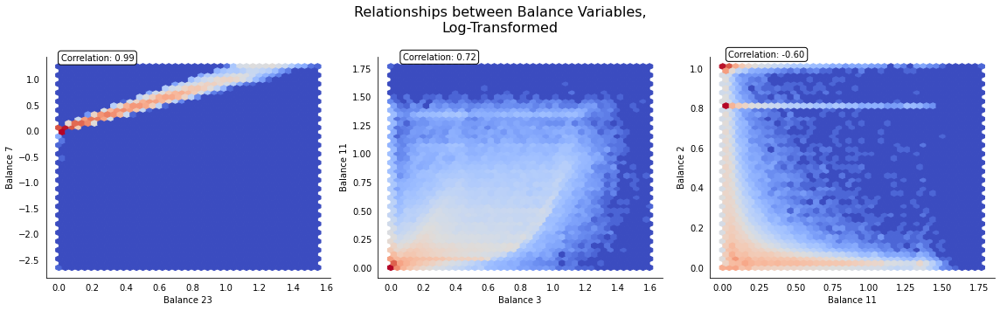

In [26]:
fig, ax = plt.subplots(1,3, figsize=(16,5))
fig.suptitle('Relationships between Balance Variables,\nLog-Transformed',fontsize=16)
ax[0].hexbin(x='Balance 23', y='Balance 7', data=plot_df, bins='log', gridsize=40, cmap='coolwarm')
ax[0].text(.23,1.42, 'Correlation: {:.2f}'.format(plot_df[['Balance 23','Balance 7']].corr().iloc[1,0]), 
           ha="center", va="center",bbox=dict(boxstyle="round,pad=0.3",fc="white"))
ax[0].set(xlabel='Balance 23',ylabel='Balance 7')
ax[1].hexbin(x='Balance 3', y='Balance 11', data=plot_df, bins='log', gridsize=40, cmap='coolwarm')
ax[1].text(.3,1.85, 'Correlation: {:.2f}'.format(plot_df[['Balance 3','Balance 11']].corr().iloc[1,0]), 
           ha="center", va="center",bbox=dict(boxstyle="round,pad=0.3",fc="white"))
ax[1].set(xlabel='Balance 3',ylabel='Balance 11')
ax[2].hexbin(x='Balance 11', y='Balance 2', data=plot_df, bins='log', gridsize=40, cmap='coolwarm')
ax[2].text(.3,1.07, 'Correlation: {:.2f}'.format(plot_df[['Balance 11','Balance 2']].corr().iloc[1,0]), 
           ha="center", va="center",bbox=dict(boxstyle="round,pad=0.3",fc="white"))
ax[2].set(xlabel='Balance 11',ylabel='Balance 2')
for i in range(3):
    ax[i].tick_params(left=False,bottom=False)
sns.despine()
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.show()

## EDA of risk variables

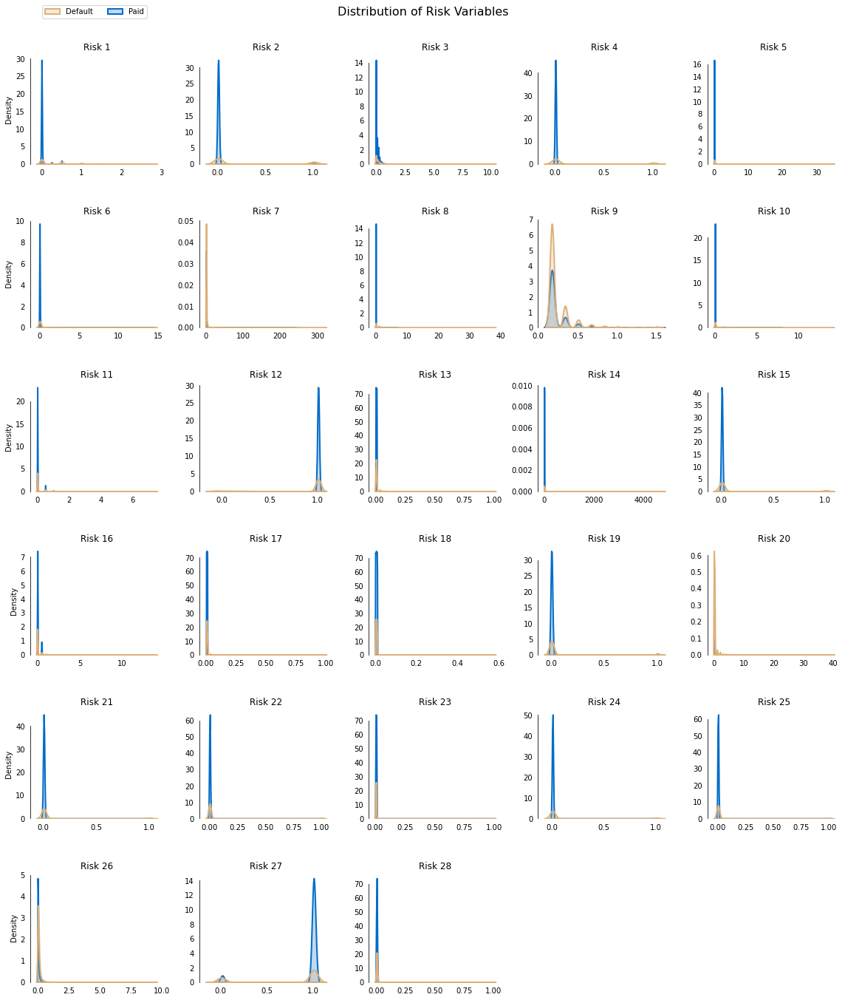

In [42]:
cols=[col for col in df.columns if (col.startswith(('R','T'))) & (col not in cat_cols[:-1]) ]
cols.remove('Risk ID')
plot_df=df[cols]
fig, ax = plt.subplots(6,5, figsize=(16,24))
fig.suptitle('Distribution of Risk Variables',fontsize=16)
row=0
col=[0,1,2,3,4]*6
for i, column in enumerate(plot_df.columns[:-1]):
    if (i!=0)&(i%5==0):
        row+=1
    sns.kdeplot(x=column, hue='Target', palette=pal[::-1], hue_order=[1,0], 
                label=['Default','Paid'], data=plot_df, 
                fill=True, linewidth=2, legend=False, ax=ax[row,col[i]])
    ax[row,col[i]].tick_params(left=False,bottom=False)
    ax[row,col[i]].set(title='\n\n{}'.format(column), xlabel='', ylabel=('Density' if i%5==0 else ''))
for i in range(3,5):
    ax[5,i].set_visible(False)
handles, _ = ax[0,0].get_legend_handles_labels() 
fig.legend(labels=['Default','Paid'], handles=reversed(handles), ncol=2, bbox_to_anchor=(0.18, 0.984))
sns.despine(bottom=True, trim=True)
plt.tight_layout(rect=[0, 0.2, 1, 0.99])

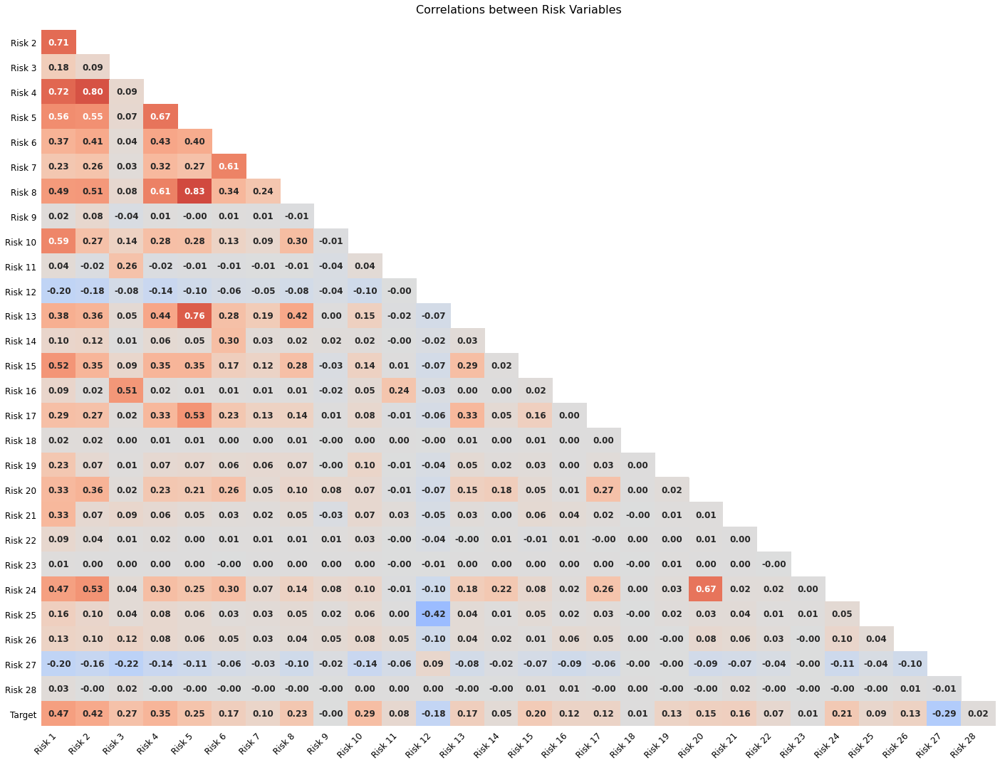

In [43]:
corr=plot_df.corr()
mask=np.triu(np.ones_like(corr, dtype=bool))[1:,:-1]
corr=corr.iloc[1:,:-1].copy()
fig, ax = plt.subplots(figsize=(24,18))   
sns.heatmap(corr, mask=mask, vmin=-1, vmax=1, center=0, annot=True, fmt='.2f', 
            cmap='coolwarm', annot_kws={'fontsize':12,'fontweight':'bold'}, cbar=False)
ax.tick_params(left=False,bottom=False)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right',fontsize=12)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)
plt.title('Correlations between Risk Variables\n', fontsize=16)
fig.show()

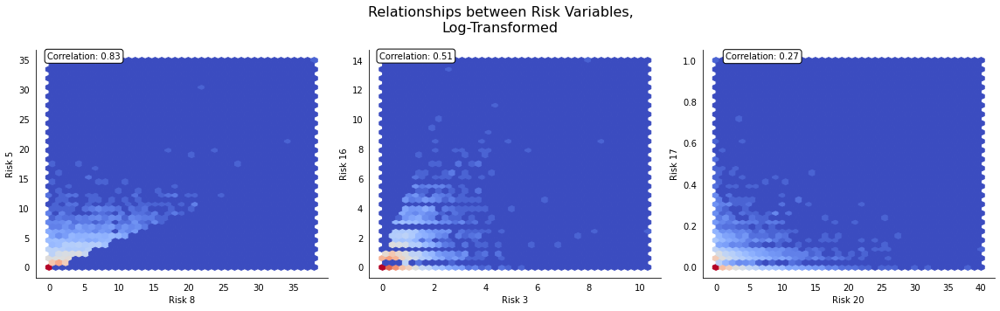

In [44]:
fig, ax = plt.subplots(1,3, figsize=(16,5))
fig.suptitle('Relationships between Risk Variables,\nLog-Transformed',fontsize=16)
ax[0].hexbin(x='Risk 8', y='Risk 5', data=plot_df, bins='log', gridsize=40, cmap='coolwarm')
ax[0].text(5,35.7, 'Correlation: {:.2f}'.format(plot_df[['Risk 8','Risk 5']].corr().iloc[1,0]), 
           ha="center", va="center",bbox=dict(boxstyle="round,pad=0.3",fc="white"))
ax[0].set(xlabel='Risk 8',ylabel='Risk 5')
ax[1].hexbin(x='Risk 3', y='Risk 16', data=plot_df, bins='log', gridsize=40, cmap='coolwarm')
ax[1].text(1.3,14.3, 'Correlation: {:.2f}'.format(plot_df[['Risk 3','Risk 16']].corr().iloc[1,0]), 
           ha="center", va="center",bbox=dict(boxstyle="round,pad=0.3",fc="white"))
ax[1].set(xlabel='Risk 3',ylabel='Risk 16')
ax[2].hexbin(x='Risk 20', y='Risk 17', data=plot_df, bins='log', gridsize=40, cmap='coolwarm')
ax[2].text(7,1.02, 'Correlation: {:.2f}'.format(plot_df[['Risk 20','Risk 17']].corr().iloc[1,0]), 
           ha="center", va="center",bbox=dict(boxstyle="round,pad=0.3",fc="white"))
ax[2].set(xlabel='Risk 20',ylabel='Risk 17')
for i in range(3):
    ax[i].tick_params(left=False,bottom=False)
sns.despine()
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.show()


## EDA of categorical Variables


In [13]:
rgb=['rgba'+str(matplotlib.colors.to_rgba(i,0.7)) for i in pal]
fig = make_subplots(rows=4, cols=3, 
                    subplot_titles=cat_cols[:-1], 
                    vertical_spacing=0.1)
row=0
c=[1,2,3]*5
plot_df=df[cat_cols]
for i,col in enumerate(cat_cols[:-1]):
    if i%3==0:
        row+=1
    plot_df[col]=plot_df[col].astype(object)
    df=plot_df.groupby(col)['Target'].value_counts().rename('count').reset_index().replace('',np.nan)
    
    fig.add_trace(go.Bar(x=df[df.Target==1][col], y=df[df.Target==1]['count'],
                         marker_color=rgb[1], marker_line=dict(color=pal[1],width=2), 
                         hovertemplate='Value %{x} Frequency = %{y}',
                         name='Default', showlegend=(True if i==0 else False)),
                  row=row, col=c[i])
    fig.add_trace(go.Bar(x=df[df.Target==0][col], y=df[df.Target==0]['count'],
                         marker_color=rgb[0], marker_line=dict(color=pal[0],width=2),
                         hovertemplate='Value %{x} Frequency = %{y}',
                         name='Paid', showlegend=(True if i==0 else False)),
                  row=row, col=c[i])
    if i%3==0:
        fig.update_yaxes(title='Frequency',row=row,col=c[i])
fig.update_layout(template=temp,title="Distribution of Categorical Variables",
                  legend=dict(orientation="h",yanchor="bottom",y=1.03,xanchor="right",x=0.2),
                  barmode='group',height=1500,width=900)
fig.show()

In [79]:
corr = df.corr()

In [86]:
corr

Delinquency 48    0.612357
Delinquency 55    0.540676
Balance 9         0.540561
Delinquency 61    0.534536
Delinquency 44    0.530538
                    ...   
Balance 33       -0.520651
Balance 18       -0.546277
Balance 2        -0.557697
Payment 2        -0.667293
Delinquency 66         NaN
Name: Target, Length: 185, dtype: float64

In [20]:
corr=df.corr()
corr=corr['Target'].sort_values(ascending=False)[1:-1]
pal=sns.color_palette("Reds_r",135).as_hex()
rgb=['rgba'+str(matplotlib.colors.to_rgba(i,0.7)) for i in pal]
fig = go.Figure()
fig.add_trace(go.Bar(x=corr[corr>=0], y=corr[corr>=0].index, 
                     marker_color=rgb, orientation='h', 
                     marker_line=dict(color=pal,width=2), name='',
                     hovertemplate='%{y} correlation with target: %{x:.3f}',
                     showlegend=False))

pal=sns.color_palette("Blues",100).as_hex()
rgb=['rgba'+str(matplotlib.colors.to_rgba(i,0.7)) for i in pal]
fig.add_trace(go.Bar(x=corr[corr<0], y=corr[corr<0].index, 
                     marker_color=rgb[25:], orientation='h', 
                     marker_line=dict(color=pal[25:],width=2), name='',
                     hovertemplate='%{y} correlation with target: %{x:.3f}',
                     showlegend=False))
fig.update_layout(template=temp,title="Feature Correlations with Target",
                  xaxis_title="Correlation", margin=dict(l=150),
                  height=3000, width=700, hovermode='closest')
fig.show()

There are several strong correlations with the target variable. 
Payment 2 is the most negatively correlated with the probability of defaulting with a correlation of -0.67, 
while Delinquency 48 is the most positively correlated overall at 0.61. 
Delinquency 87 is also missing from the correlations above due to the proportion of null values. 
In fact, 24 of the top 30 features with missing values are in Delinquency variables

In [88]:
null=round((df.isna().sum()/df.shape[0]*100),2).sort_values(ascending=False).astype(str)+('%')
null=null.to_frame().rename(columns={0:'Missing %'})
null.head(30)


,Missing %
Delinquency 87,99.86%
Delinquency 88,99.82%
Delinquency 108,99.43%
Delinquency 110,99.2%
Delinquency 111,99.2%
Balance 39,99.11%
Delinquency 73,99.08%
Balance 42,98.66%
Delinquency 136,96.43%
Delinquency 138,96.43%


## Dealing with Missing Values 
    -Default Direction

In [189]:
ratio_of_missing_data = (df.isna().sum()/df.shape[0])
column_with_large_missing_value = df.columns[ratio_of_missing_data>0.8]

In [190]:
column_with_large_missing_value,len(column_with_large_missing_value)

(Index(['Delinquency 42', 'Delinquency 49', 'Delinquency 66', 'Delinquency 73',
        'Delinquency 76', 'Risk 9', 'Balance 29', 'Delinquency 87',
        'Delinquency 88', 'Delinquency 106', 'Risk 26', 'Delinquency 108',
        'Delinquency 110', 'Delinquency 111', 'Balance 39', 'Balance 42',
        'Delinquency 132', 'Delinquency 134', 'Delinquency 135',
        'Delinquency 136', 'Delinquency 137', 'Delinquency 138',
        'Delinquency 142'],
       dtype='object'),
 23)

In [71]:
cat_imputer = SimpleImputer(strategy="most_frequent")
num_imputer = SimpleImputer(strategy="median") # less sensitve to outliers

In [191]:
df = df.drop(columns=column_with_large_missing_value,axis=1)

In [194]:
df

,Payment 2,Delinquency 39,Balance 1,Balance 2,Risk 1,Spend 3,Delinquency 41,Balance 3,Delinquency 43,Delinquency 44,...,Delinquency 131,Delinquency 133,Risk 28,Delinquency 139,Delinquency 140,Delinquency 141,Delinquency 143,Delinquency 144,Delinquency 145,Target
customer_ID,,,,,,,,,,,,,,,,,,,,,
0000099d6bd597052cdcda90ffabf56573fe9d7c79be5fbac11a8ed792feb62a,0.934745,0.009119,0.009382,1.007647,0.006104,0.135021,0.001604,0.007174,NaN,0.003258,...,0.005702,0.006210,0.002715,0.007186,0.004234,0.005086,0.005810,0.002970,0.008533,0
00000fd6641609c6ece5454664794f0340ad84dddce9a267a310b5ae68e9d8e5,0.880519,0.178126,0.034684,1.004028,0.006911,0.165509,0.005552,0.005068,0.060646,0.008781,...,0.001928,0.002996,0.001701,0.002980,0.007479,0.007870,0.003284,0.003169,0.008514,0
00001b22f846c82c51f6e3958ccd81970162bae8b007e80662ef27519fcc18c1,0.880875,0.009704,0.004284,0.812649,0.006450,NaN,0.003796,0.007196,NaN,0.000628,...,0.003470,0.009881,0.007691,0.007383,0.006623,0.000964,0.002202,0.000834,0.003444,0
000041bdba6ecadd89a52d11886e8eaaec9325906c9723355abb5ca523658edc,0.621776,0.001083,0.012564,1.006183,0.007829,0.287766,0.004532,0.009937,0.046104,0.007792,...,0.004576,0.001789,0.005140,0.002704,0.006184,0.001899,0.008183,0.005560,0.002983,0
00007889e4fcd2614b6cbe7f8f3d2e5c728eca32d9eb8ad51ca8b8c4a24cefed,0.871900,0.005573,0.007679,0.815746,0.001247,NaN,0.000231,0.005528,0.044671,0.002436,...,0.008897,0.005045,0.003706,0.002974,0.004162,0.005764,0.008154,0.006944,0.000905,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ffff41c8a52833b56430603969b9ca48d208e7c192c6a4081a6acc28cf4f8af7,0.844229,0.447585,0.028515,1.009866,0.001928,0.128707,0.003482,0.005893,0.113053,0.002280,...,0.009489,0.002072,0.004589,0.007917,0.001520,0.005530,0.001430,0.003009,0.004843,0
ffff518bb2075e4816ee3fe9f3b152c57fc0e6f01bf7fdd3e5b57cfcbee30286,0.831279,0.033670,0.292360,0.055656,0.006953,NaN,0.005791,0.233078,0.134540,0.132158,...,1.006120,1.128724,0.004884,0.004393,0.006185,0.001480,0.004794,0.009230,0.006435,0
ffff9984b999fccb2b6127635ed0736dda94e544e67e026eee4d20f680639ff6,0.800522,0.267018,0.020563,1.007023,0.000957,0.066648,0.007424,0.006314,0.049778,0.001022,...,0.003282,0.004513,0.008924,0.006035,0.002869,0.002149,0.008031,0.000340,0.002148,0


In [78]:
cat_cols[:-1]

['Balance 30',
 'Balance 38',
 'Delinquency 63',
 'Delinquency 64',
 'Delinquency 66',
 'Delinquency 68',
 'Delinquency 114',
 'Delinquency 116',
 'Delinquency 117',
 'Delinquency 120',
 'Delinquency 126']

In [83]:
# Label Encoding for Categorical Columns
cat_encoding = [c for c in cat_cols[:-1] if c not in column_with_large_missing_value ]
len(cat_encoding)

10

In [195]:
for c in cat_encoding :
    df[c] = LabelEncoder().fit_transform(df[c])


In [85]:
# Standard scaling for numerical columns
numerical_scaling = [c for c in df.columns if c not in cat_cols]
len(numerical_scaling)

155

In [197]:
df[numerical_scaling] = StandardScaler().fit_transform(df[numerical_scaling])

In [198]:
df.head()

,Payment 2,Delinquency 39,Balance 1,Balance 2,Risk 1,Spend 3,Delinquency 41,Balance 3,Delinquency 43,Delinquency 44,...,Delinquency 131,Delinquency 133,Risk 28,Delinquency 139,Delinquency 140,Delinquency 141,Delinquency 143,Delinquency 144,Delinquency 145,Target
customer_ID,,,,,,,,,,,,,,,,,,,,,
0000099d6bd597052cdcda90ffabf56573fe9d7c79be5fbac11a8ed792feb62a,1.119413,-0.478349,-0.560588,1.009437,-0.363525,-0.472948,-0.321912,-0.578900,NaN,-0.547647,...,-0.355464,-0.247456,-0.113774,-0.456583,-0.161544,-0.461182,-0.460007,-0.269435,-0.280393,0
00000fd6641609c6ece5454664794f0340ad84dddce9a267a310b5ae68e9d8e5,0.916736,-0.058096,-0.451183,1.000654,-0.360628,-0.319622,-0.308929,-0.587157,-0.454164,-0.525303,...,-0.367549,-0.265032,-0.152951,-0.467624,-0.140320,-0.453230,-0.466642,-0.268341,-0.280486,0
00001b22f846c82c51f6e3958ccd81970162bae8b007e80662ef27519fcc18c1,0.918064,-0.476894,-0.582635,0.536308,-0.362283,NaN,-0.314704,-0.578816,NaN,-0.558290,...,-0.362613,-0.227382,0.078443,-0.456065,-0.145923,-0.472951,-0.469482,-0.281172,-0.306211,0
000041bdba6ecadd89a52d11886e8eaaec9325906c9723355abb5ca523658edc,-0.050358,-0.498331,-0.546830,1.005884,-0.357334,0.295211,-0.312284,-0.568066,-0.518209,-0.529307,...,-0.359069,-0.271627,-0.020113,-0.468349,-0.148790,-0.470282,-0.453778,-0.255208,-0.308548,0
00007889e4fcd2614b6cbe7f8f3d2e5c728eca32d9eb8ad51ca8b8c4a24cefed,0.884520,-0.487166,-0.567953,0.543821,-0.380955,NaN,-0.326429,-0.585354,-0.524519,-0.550976,...,-0.345234,-0.253825,-0.075524,-0.467642,-0.162015,-0.459244,-0.453854,-0.247606,-0.319095,0


## Fill na

This dataset is rich of NA information. We have both systemic NA and very likely missing at random NA. 
This means feature-wise NA should not be treated equally when doing any kind of feature engineering

In [200]:
df2 = df.copy()

In [202]:
# There is no need to fill na in this data
#df[cat_encoding] = cat_imputer.fit_transform(df[cat_encoding])
#df[numerical_scaling] = num_imputer.fit_transform(df[numerical_scaling]) 

In [206]:
df.isna().sum()

Payment 2          0
Delinquency 39     0
Balance 1          0
Balance 2          0
Risk 1             0
                  ..
Delinquency 141    0
Delinquency 143    0
Delinquency 144    0
Delinquency 145    0
Target             0
Length: 166, dtype: int64

## Planning

In [222]:
# aggregate for all data i have
test_num_agg = df.groupby("customer_ID")[numerical_scaling].agg(['mean', 'std', 'min', 'max', 'last'])

In [223]:
test_num_agg

Payment 2                \
                                                        mean std       min   
customer_ID                                                                  
0000099d6bd597052cdcda90ffabf56573fe9d7c79be5fb...  1.119413 NaN  1.119413   
00000fd6641609c6ece5454664794f0340ad84dddce9a26...  0.916736 NaN  0.916736   
00001b22f846c82c51f6e3958ccd81970162bae8b007e80...  0.918064 NaN  0.918064   
000041bdba6ecadd89a52d11886e8eaaec9325906c97233... -0.050358 NaN -0.050358   
00007889e4fcd2614b6cbe7f8f3d2e5c728eca32d9eb8ad...  0.884520 NaN  0.884520   
...                                                      ...  ..       ...   
ffff41c8a52833b56430603969b9ca48d208e7c192c6a40...  0.781097 NaN  0.781097   
ffff518bb2075e4816ee3fe9f3b152c57fc0e6f01bf7fdd...  0.732693 NaN  0.732693   
ffff9984b999fccb2b6127635ed0736dda94e544e67e026...  0.617733 NaN  0.617733   
ffffa5c46bc8de74f5a4554e74e239c8dee6b9baf388145...  0.444332 NaN  0.444332   
fffff1d38b785cef84adeace64f8f83db3a0c31e8d92eab...  1.296691 NaN  1.296691   

                                                                        \
                                                         max      last   
customer_ID                                                              
0000099d6bd597052cdcda90ffabf56573fe9d7c79be5fb...  1.119413  1.119413   
00000fd6641609c6ece5454664794f0340ad84dddce9a26...  0.916736  0.916736   
00001b22f846c82c51f6e3958ccd81970162bae8b007e80...  0.918064  0.918064   
000041bdba6ecadd89a52d11886e8eaaec9325906c97233... -0.050358 -0.050358   
00007889e4fcd2614b6cbe7f8f3d2e5c728eca32d9eb8ad...  0.884520  0.884520   
...                                                      ...       ...   
ffff41c8a52833b56430603969b9ca48d208e7c192c6a40...  0.781097  0.781097   
ffff518bb2075e4816ee3fe9f3b152c57fc0e6f01bf7fdd...  0.732693  0.732693   
ffff9984b999fccb2b6127635ed0736dda94e544e67e026...  0.617733  0.617733   
ffffa5c46bc8de74f5a4554e74e239c8dee6b9baf388145...  0.444332  0.444332   
fffff1d38b785cef84adeace64f8f83db3a0c31e8d92eab...  1.296691  1.296691   

                                                   Delinquency 39      \
                                                             mean std   
customer_ID                                                             
0000099d6bd597052cdcda90ffabf56573fe9d7c79be5fb...      -0.478349 NaN   
00000fd6641609c6ece5454664794f0340ad84dddce9a26...      -0.058096 NaN   
00001b22f846c82c51f6e3958ccd81970162bae8b007e80...      -0.476894 NaN   
000041bdba6ecadd89a52d11886e8eaaec9325906c97233...      -0.498331 NaN   
00007889e4fcd2614b6cbe7f8f3d2e5c728eca32d9eb8ad...      -0.487166 NaN   
...                                                           ...  ..   
ffff41c8a52833b56430603969b9ca48d208e7c192c6a40...       0.611940 NaN   
ffff518bb2075e4816ee3fe9f3b152c57fc0e6f01bf7fdd...      -0.417299 NaN   
ffff9984b999fccb2b6127635ed0736dda94e544e67e026...       0.162943 NaN   
ffffa5c46bc8de74f5a4554e74e239c8dee6b9baf388145...      -0.479591 NaN   
fffff1d38b785cef84adeace64f8f83db3a0c31e8d92eab...      -0.494872 NaN   

                                                                        \
                                                         min       max   
customer_ID                                                              
0000099d6bd597052cdcda90ffabf56573fe9d7c79be5fb... -0.478349 -0.478349   
00000fd6641609c6ece5454664794f0340ad84dddce9a26... -0.058096 -0.058096   
00001b22f846c82c51f6e3958ccd81970162bae8b007e80... -0.476894 -0.476894   
000041bdba6ecadd89a52d11886e8eaaec9325906c97233... -0.498331 -0.498331   
00007889e4fcd2614b6cbe7f8f3d2e5c728eca32d9eb8ad... -0.487166 -0.487166   
...                                                      ...       ...   
ffff41c8a52833b56430603969b9ca48d208e7c192c6a40...  0.611940  0.611940   
ffff518bb2075e4816ee3fe9f3b152c57fc0e6f01bf7fdd... -0.417299 -0.417299   
ffff9984b999fccb2b6127635ed0736dda94e544e67e026...  0.162943  0.162943   
ffffa5c46b

In [225]:
#test = df.groupby('customer_ID').agg({'S_2':'count'})

In [203]:
X=df.drop(['Target'],axis=1)
y=df['Target']

In [204]:
X.head()

,Payment 2,Delinquency 39,Balance 1,Balance 2,Risk 1,Spend 3,Delinquency 41,Balance 3,Delinquency 43,Delinquency 44,...,Delinquency 130,Delinquency 131,Delinquency 133,Risk 28,Delinquency 139,Delinquency 140,Delinquency 141,Delinquency 143,Delinquency 144,Delinquency 145
customer_ID,,,,,,,,,,,,,,,,,,,,,
0000099d6bd597052cdcda90ffabf56573fe9d7c79be5fbac11a8ed792feb62a,1.119413,-0.478349,-0.560588,1.009437,-0.363525,-0.472948,-0.321912,-0.578900,-0.314157,-0.547647,...,-0.520929,-0.355464,-0.247456,-0.113774,-0.456583,-0.161544,-0.461182,-0.460007,-0.269435,-0.280393
00000fd6641609c6ece5454664794f0340ad84dddce9a267a310b5ae68e9d8e5,0.916736,-0.058096,-0.451183,1.000654,-0.360628,-0.319622,-0.308929,-0.587157,-0.454164,-0.525303,...,-0.525781,-0.367549,-0.265032,-0.152951,-0.467624,-0.140320,-0.453230,-0.466642,-0.268341,-0.280486
00001b22f846c82c51f6e3958ccd81970162bae8b007e80662ef27519fcc18c1,0.918064,-0.476894,-0.582635,0.536308,-0.362283,-0.322637,-0.314704,-0.578816,-0.314157,-0.558290,...,-0.524676,-0.362613,-0.227382,0.078443,-0.456065,-0.145923,-0.472951,-0.469482,-0.281172,-0.306211
000041bdba6ecadd89a52d11886e8eaaec9325906c9723355abb5ca523658edc,-0.050358,-0.498331,-0.546830,1.005884,-0.357334,0.295211,-0.312284,-0.568066,-0.518209,-0.529307,...,-0.531021,-0.359069,-0.271627,-0.020113,-0.468349,-0.148790,-0.470282,-0.453778,-0.255208,-0.308548
00007889e4fcd2614b6cbe7f8f3d2e5c728eca32d9eb8ad51ca8b8c4a24cefed,0.884520,-0.487166,-0.567953,0.543821,-0.380955,-0.322637,-0.326429,-0.585354,-0.524519,-0.550976,...,1.929535,-0.345234,-0.253825,-0.075524,-0.467642,-0.162015,-0.459244,-0.453854,-0.247606,-0.319095


In [207]:
# SplittingData 
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X, y, random_state=42, test_size=0.2)

params = {'boosting_type': 'gbdt',
              'n_estimators': 1000,
              'num_leaves': 50,
              'learning_rate': 0.05,
              'colsample_bytree': 0.9,
              'min_child_samples': 2000,
              'max_bins': 500,
              'reg_alpha': 2,
              'objective': 'binary',
              'random_state': 21}
    
gbm_main = LGBMClassifier(**params).fit(X_train, y_train, 
                                    eval_set=[(X_train, y_train), (X_val, y_val)],
                                    callbacks=[early_stopping(200), log_evaluation(500)],
                                    eval_metric=['auc','binary_logloss'])

Training until validation scores don't improve for 200 rounds
[500]	training's auc: 0.971627	training's binary_logloss: 0.190776	valid_1's auc: 0.959115	valid_1's binary_logloss: 0.223181
Early stopping, best iteration is:
[472]	training's auc: 0.971041	training's binary_logloss: 0.192434	valid_1's auc: 0.959124	valid_1's binary_logloss: 0.223142


In [163]:
df_trained = df.copy()

## Train as K-Folds
    -We have Target classes which un balanced classes

In [170]:

y_valid, gbm_val_probs, gbm_test_preds, gini=[],[],[],[]
ft_importance=pd.DataFrame(index=X.columns)
sk_fold = StratifiedKFold(n_splits=10, shuffle=True, random_state=21)
for fold, (train_idx, val_idx) in enumerate(sk_fold.split(X, y)):
    
    print("\nFold {}".format(fold+1))
    X_train, y_train = X.iloc[train_idx,:], y[train_idx]
    X_val, y_val = X.iloc[val_idx,:], y[val_idx]
    print("Train shape: {}, {}, Valid shape: {}, {}\n".format(
        X_train.shape, y_train.shape, X_val.shape, y_val.shape))
    
    params = {'boosting_type': 'gbdt',
              'n_estimators': 1000,
              'num_leaves': 50,
              'learning_rate': 0.05,
              'colsample_bytree': 0.9,
              'min_child_samples': 2000,
              'max_bins': 500,
              'reg_alpha': 2,
              'objective': 'binary',
              'random_state': 21}
    
    gbm_with_kf = LGBMClassifier(**params).fit(X_train, y_train, 
                                       eval_set=[(X_train, y_train), (X_val, y_val)],
                                       callbacks=[early_stopping(200), log_evaluation(500)],
                                       eval_metric=['auc','binary_logloss'])
    gbm_prob = gbm_with_kf.predict_proba(X_val)[:,1]
    gbm_val_probs.append(gbm_prob)
    y_valid.append(y_val)
    
    y_pred=pd.DataFrame(data={'prediction':gbm_prob})
    y_true=pd.DataFrame(data={'target':y_val.reset_index(drop=True)})
    
    gini_score=amex_metric(y_true = y_true, y_pred = y_pred)
    gini.append(gini_score)
    
    auc_score=roc_auc_score(y_val, gbm_prob)
    
    #gbm_test_preds.append(gbm.predict_proba(test)[:,1])    
    ft_importance["Importance_Fold"+str(fold)]=gbm.feature_importances_    
    print("Validation Gini: {:.5f}, AUC: {:.4f}".format(gini_score,auc_score))
    
    del X_train, y_train, X_val, y_val
    _ = gc.collect()
    
del X, y
plot_roc(y_valid, gbm_val_probs)


Fold 1
Train shape: (413021, 165), (413021,), Valid shape: (45892, 165), (45892,)

Training until validation scores don't improve for 200 rounds
[500]	training's auc: 0.970955	training's binary_logloss: 0.192389	valid_1's auc: 0.95942	valid_1's binary_logloss: 0.223139
Early stopping, best iteration is:
[529]	training's auc: 0.971514	training's binary_logloss: 0.190834	valid_1's auc: 0.959453	valid_1's binary_logloss: 0.223066
Validation Gini: 0.78433, AUC: 0.9595

Fold 2
Train shape: (413021, 165), (413021,), Valid shape: (45892, 165), (45892,)

Training until validation scores don't improve for 200 rounds
[500]	training's auc: 0.970966	training's binary_logloss: 0.192338	valid_1's auc: 0.959437	valid_1's binary_logloss: 0.223298
Early stopping, best iteration is:
[461]	training's auc: 0.970189	training's binary_logloss: 0.194499	valid_1's auc: 0.959463	valid_1's binary_logloss: 0.223224
Validation Gini: 0.78467, AUC: 0.9595

Fold 3
Train shape: (413021, 165), (413021,), Valid shape:

In [186]:
X_train, X_val, y_train, y_val = train_test_split(X, y, random_state=42, test_size=0.2)

gbm.score(X_train,y_train),gbm.score(X_val,y_val)


(0.9166861874540354, 0.9160846779904775)

In [179]:
gbm_val_probs # predict for each trained k-Fold & later take a mean for final prediction

[array([0.0068915 , 0.00193145, 0.00654011, ..., 0.38316693, 0.00273948,
        0.08106189]),
 array([0.00130092, 0.97689002, 0.65542278, ..., 0.15714416, 0.00333755,
        0.61002472]),
 array([8.35656877e-01, 6.21616843e-04, 8.06179576e-01, ...,
        6.89926594e-01, 3.28726341e-02, 1.32816467e-03]),
 array([7.33412750e-04, 9.80443414e-03, 9.78039240e-01, ...,
        9.17574325e-01, 9.58347596e-01, 9.27519356e-04]),
 array([0.00058907, 0.25103286, 0.00107136, ..., 0.0101006 , 0.00087164,
        0.00272641]),
 array([9.09545611e-01, 8.43587755e-01, 6.61329486e-04, ...,
        9.85341996e-01, 1.14438502e-02, 4.06798891e-02]),
 array([0.71960432, 0.99047658, 0.31498148, ..., 0.01367675, 0.00919089,
        0.00991974]),
 array([1.90638813e-02, 1.45586433e-02, 9.90660399e-01, ...,
        9.31749374e-04, 7.24020247e-04, 6.63982015e-03]),
 array([0.00177541, 0.01436692, 0.09739823, ..., 0.99810677, 0.00626315,
        0.83627123]),
 array([0.0016803 , 0.99763136, 0.83485027, ..., 

## Normalized GIni Coofficient

### Valid

In [208]:
y_val_pred = gbm.predict_proba(X_val)[:,1]

In [209]:
y_val_pred

array([0.04601839, 0.67110824, 0.07715206, ..., 0.00184   , 0.00396   ,
       0.00090108])

In [210]:
y_true = pd.DataFrame(data={'target':y_val.reset_index(drop=True)})

In [211]:
y_valid_pred = pd.DataFrame(data={'Prediction':y_val_pred})

In [219]:
gini_score = amex_metric_numpy(y_true.to_numpy().ravel(), y_val_pred) # Gini score calculated usig numpy 

In [220]:
auc_score=roc_auc_score(y_val, y_val_pred)

In [221]:
print("Cometition Metric: {:.5f}, AUC: {:.4f}".format(gini_score,auc_score))

Cometition Metric: 0.78506, AUC: 0.9591


In [92]:
gbm.score(X_train,y_train),gbm.score(X_val,y_val)

(0.9206629804156565, 0.9001231164812656)

In [49]:
#plot_roc(y_val, y_val_pred)

## Feature Importance



In [151]:
ft_importance=pd.DataFrame(index=X.columns)

In [152]:
ft_importance["Importance_Fold"]=gbm.feature_importances_ 

In [153]:
ft_importance = ft_importance.sort_values(by='Importance_Fold',ascending=False)

In [154]:
ft_importance

,Importance_Fold
Payment 2,681
Balance 4,536
Spend 3,511
Delinquency 43,501
Delinquency 46,465
...,...
Delinquency 68,14
Balance 30,4
Delinquency 126,0
Delinquency 116,0


In [160]:
feature_importance=ft_importance.Importance_Fold.sort_values(ascending=False)

feature_importance.tail(5) #Model didn't learn anything from these Columns
feature_importance['Spend 24']

173

In [178]:
ft_importance.avg['Balance 9']

199.7

In [177]:
ft_importance.avg.sort_values(ascending=False).tail(5)

Delinquency 68     10.8
Balance 30          6.0
Delinquency 126     4.5
Balance 31          2.4
Delinquency 116     0.0
Name: avg, dtype: float64

In [173]:
ft_importance['avg']=ft_importance.mean(axis=1)
ftt_importance=ft_importance.avg.nlargest(50).sort_values(ascending=True)

pal=sns.color_palette("YlGnBu", 65).as_hex()
fig=go.Figure()
for i in range(len(ftt_importance.index)):
    fig.add_shape(dict(type="line", y0=i, y1=i, x0=0, x1=ftt_importance[i], 
                       line_color=pal[::-1][i],opacity=0.8,line_width=4))
fig.add_trace(go.Scatter(x=ftt_importance, y=ftt_importance.index, mode='markers', 
                         marker_color=pal[::-1], marker_size=8,
                         hovertemplate='%{y} Importance = %{x:.0f}<extra></extra>'))
fig.update_layout(template=temp,title='LGBM Feature Importance<br>Top 50', 
                  margin=dict(l=150,t=80),
                  xaxis=dict(title='Importance', zeroline=False),
                  yaxis_showgrid=False, height=1000, width=800)
fig.show()

## Submission


## Metric Methods

In [47]:
def plot_roc(y_val,y_prob):
    colors=px.colors.qualitative.Prism
    fig=go.Figure()
    fig.add_trace(go.Scatter(x=np.linspace(0,1,11), y=np.linspace(0,1,11), 
                             name='Random Chance',mode='lines', showlegend=False,
                             line=dict(color="Black", width=1, dash="dot")))
    for i in range(len(y_val)):
        y=y_val[i]
        prob=y_prob[i]
        fpr, tpr, _ = roc_curve(y, prob)
        roc_auc = auc(fpr,tpr)
        fig.add_trace(go.Scatter(x=fpr, y=tpr, line=dict(color=colors[::-1][i+1], width=3), 
                                 hovertemplate = 'True positive rate = %{y:.3f}<br>False positive rate = %{x:.3f}',
                                 name='Fold {}:  Gini = {:.3f}, AUC = {:.3f}'.format(i+1, gini[i],roc_auc)))
    fig.update_layout(template=temp, title="Cross-Validation ROC Curves", 
                      hovermode="x unified", width=700,height=600,
                      xaxis_title='False Positive Rate (1 - Specificity)',
                      yaxis_title='True Positive Rate (Sensitivity)',
                      legend=dict(orientation='v', y=.07, x=1, xanchor="right",
                                  bordercolor="black", borderwidth=.5))
    fig.show()

In [25]:
import numpy as np

def amex_metric_numpy(y_true: np.array, y_pred: np.array) -> float:

    # count of positives and negatives
    n_pos = y_true.sum()
    n_neg = y_true.shape[0] - n_pos

    # sorting by descring prediction values
    indices = np.argsort(y_pred)[::-1]
    preds, target = y_pred[indices], y_true[indices]

    # filter the top 4% by cumulative row weights
    weight = 20.0 - target * 19.0
    cum_norm_weight = (weight / weight.sum()).cumsum()
    four_pct_filter = cum_norm_weight <= 0.04

    # default rate captured at 4%
    d = target[four_pct_filter].sum() / n_pos

    # weighted gini coefficient
    lorentz = (target / n_pos).cumsum()
    gini = ((lorentz - cum_norm_weight) * weight).sum()

    # max weighted gini coefficient
    gini_max = 10 * n_neg * (1 - 19 / (n_pos + 20 * n_neg))

    # normalized weighted gini coefficient
    g = gini / gini_max

    return 0.5 * (g + d)

In [169]:
def amex_metric(y_true: pd.DataFrame, y_pred: pd.DataFrame) -> float:

    def top_four_percent_captured(y_true: pd.DataFrame, y_pred: pd.DataFrame) -> float:
        df = (pd.concat([y_true, y_pred], axis='columns')
              .sort_values('prediction', ascending=False))
        df['weight'] = df['target'].apply(lambda x: 20 if x==0 else 1)
        four_pct_cutoff = int(0.04 * df['weight'].sum())
        df['weight_cumsum'] = df['weight'].cumsum()
        df_cutoff = df.loc[df['weight_cumsum'] <= four_pct_cutoff]
        return (df_cutoff['target'] == 1).sum() / (df['target'] == 1).sum()
        
    def weighted_gini(y_true: pd.DataFrame, y_pred: pd.DataFrame) -> float:
        df = (pd.concat([y_true, y_pred], axis='columns')
              .sort_values('prediction', ascending=False))
        df['weight'] = df['target'].apply(lambda x: 20 if x==0 else 1)
        df['random'] = (df['weight'] / df['weight'].sum()).cumsum()
        total_pos = (df['target'] * df['weight']).sum()
        df['cum_pos_found'] = (df['target'] * df['weight']).cumsum()
        df['lorentz'] = df['cum_pos_found'] / total_pos
        df['gini'] = (df['lorentz'] - df['random']) * df['weight']
        return df['gini'].sum()

    def normalized_weighted_gini(y_true: pd.DataFrame, y_pred: pd.DataFrame) -> float:
        y_true_pred = y_true.rename(columns={'target': 'prediction'})
        return weighted_gini(y_true, y_pred) / weighted_gini(y_true, y_true_pred)

    g = normalized_weighted_gini(y_true, y_pred)
    d = top_four_percent_captured(y_true, y_pred)

    return 0.5 * (g + d)


def plot_roc(y_val,y_prob):
    colors=px.colors.qualitative.Prism
    fig=go.Figure()
    fig.add_trace(go.Scatter(x=np.linspace(0,1,11), y=np.linspace(0,1,11), 
                             name='Random Chance',mode='lines', showlegend=False,
                             line=dict(color="Black", width=1, dash="dot")))
    for i in range(len(y_val)):
        y=y_val[i]
        prob=y_prob[i]
        fpr, tpr, _ = roc_curve(y, prob)
        roc_auc = auc(fpr,tpr)
        fig.add_trace(go.Scatter(x=fpr, y=tpr, line=dict(color=colors[::-1][i+1], width=3), 
                                 hovertemplate = 'True positive rate = %{y:.3f}<br>False positive rate = %{x:.3f}',
                                 name='Fold {}:  Gini = {:.3f}, AUC = {:.3f}'.format(i+1, gini[i],roc_auc)))
    fig.update_layout(template=temp, title="Cross-Validation ROC Curves", 
                      hovermode="x unified", width=700,height=600,
                      xaxis_title='False Positive Rate (1 - Specificity)',
                      yaxis_title='True Positive Rate (Sensitivity)',
                      legend=dict(orientation='v', y=.07, x=1, xanchor="right",
                                  bordercolor="black", borderwidth=.5))
    fig.show()